In [1]:
from ultralytics import YOLO
import cv2
import numpy as np
import imutils
from src import config, image_utils
from src.aruco_marker import ArucoMarker
from ultralytics.utils.plotting import Annotator
import math

## Load image

In [2]:
img = cv2.imread('./../datasets/images/test/34.jpeg')
img = imutils.resize(img, width=1216)

## Load Aruco markers

In [3]:
marker = ArucoMarker(config.MARKER_ARUCO_DICT, img, config.MARKER_PERIMETER_IN_CM)

In [4]:
print("ArUco Perimeter: {}".format(marker.get_perimeter()))
print("Pixels per centimeter: {}".format(marker.get_pixels_per_centimeter()))

print("Width in px: {}".format(marker.get_width()))
print("Width in cm: {}".format(marker.get_width_in_cm()))
print("Height in px: {}".format(marker.get_height()))
print("Height in cm: {}".format(marker.get_height_in_cm()))

ArUco Perimeter: 149.73137283325195
Pixels per centimeter: 5.347549029758999
Width in px: 37.33630940518894
Width in cm: 6.981948028416974
Height in px: 37.05401462729781
Height in cm: 6.929158465138514


## Draw Aruco markers

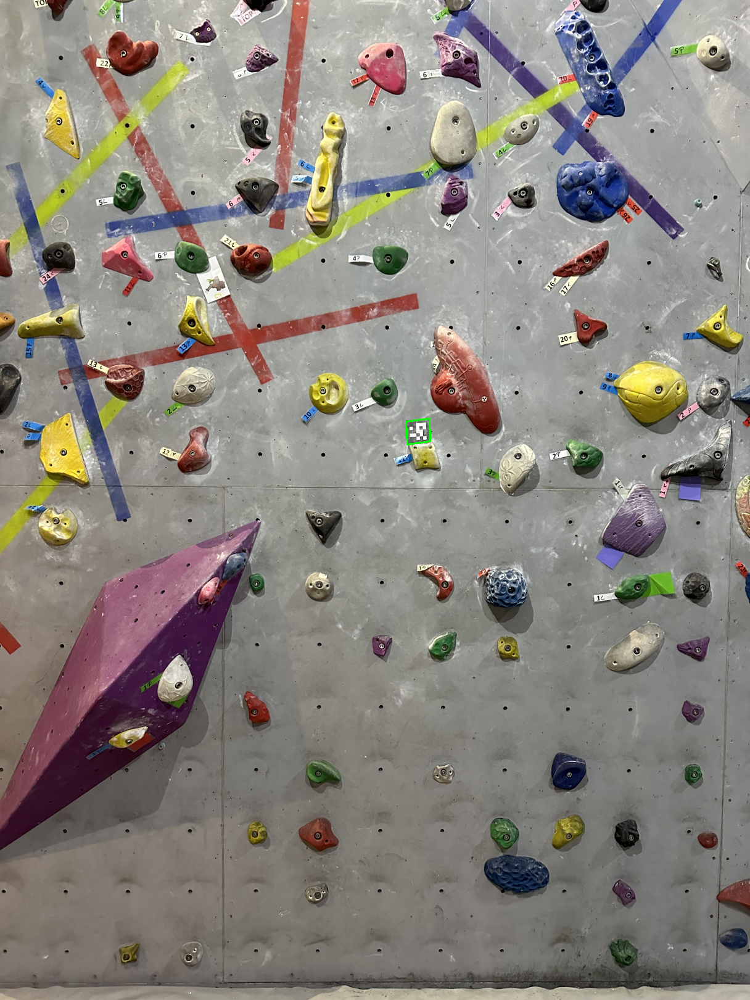

In [5]:
marker.draw_bounding_box(img, config.MARKER_BBOX_COLOR, config.LINE_WIDTH)
image_utils.display_image(img)

## Load pretrained YOLOv9 model

In [6]:
model = YOLO(config.YOLO_MODEL_PATH)

In [7]:
annotator = Annotator(img, line_width=config.LINE_WIDTH)

## Predict

In [8]:
results = model(
    img, 
    device=config.YOLO_DEVICE, 
    conf=0.98,
    imgsz=1216
)

0: 1216x928 82 holds, 1985.7ms
Speed: 9.5ms preprocess, 1985.7ms inference, 1.8ms postprocess per image at shape (1, 3, 1216, 928)


In [9]:
track_results = model.track(
    img, 
    persist=True, 
    device=config.YOLO_DEVICE, 
    imgsz=1216
)

0: 1216x928 107 holds, 1 volume, 2151.8ms
Speed: 8.8ms preprocess, 2151.8ms inference, 1.1ms postprocess per image at shape (1, 3, 1216, 928)


## Get first result

In [10]:
result = results[0]
track_result = track_results[0]

# Draw bounding boxes

In [11]:
bboxes = np.array(result.boxes.xyxy.cpu(), dtype=int)
classes = np.array(result.boxes.cls.cpu(), dtype=int)
centers = (bboxes[:, :2] + bboxes[:, 2:]) / 2

image_utils.draw_bboxes(
    img, 
    bboxes, 
    classes, 
    result.names,
    centers, 
    config.BBOX_COLOR, 
    config.BBOX_CENTER_COLOR, 
    config.LINE_WIDTH
)

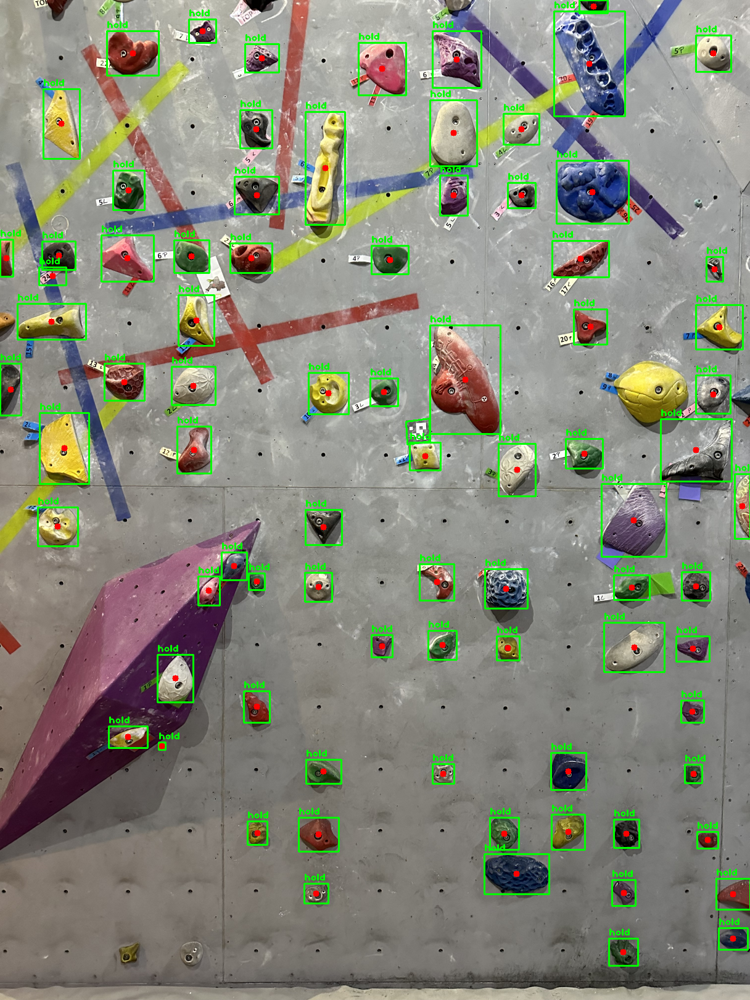

In [12]:
image_utils.display_image(img)

In [13]:
# 20% of bottom boxes from image
bottom_boxes = bboxes[bboxes[:, 3] > 0.8 * img.shape[0]]
bottom_classes = classes[bboxes[:, 3] > 0.8 * img.shape[0]]
bottom_centers = centers[bboxes[:, 3] > 0.8 * img.shape[0]]
start_bboxes_boxes_colors = (255, 0, 255)

# image_utils.draw_bboxes(
#     img, 
#     bottom_boxes, 
#     bottom_classes, 
#     result.names,
#     bottom_centers, 
#     bboxes_boxes_colors, 
#     config.BBOX_CENTER_COLOR, 
#     config.LINE_WIDTH
# )

In [14]:
# random_starting_step_id = np.random.choice(bottom_boxes.shape[0], 1, replace=False)
# random_starting_step_box = bottom_boxes[random_starting_step_id]
# random_starting_step_class = bottom_classes[random_starting_step_id]
# random_starting_step_center = bottom_centers[random_starting_step_id]
# 
# image_utils.draw_bboxes(
#     img, 
#     random_starting_step_box, 
#     random_starting_step_class, 
#     result.names,
#     random_starting_step_center, 
#     start_bboxes_boxes_colors, 
#     config.BBOX_CENTER_COLOR, 
#     config.LINE_WIDTH
# )

In [15]:
# image_utils.display_image(img)

In [16]:
# get two random bottom boxes
random_starting_steps_ids = np.random.choice(bottom_boxes.shape[0], 2, replace=False)
random_starting_steps_boxes = bottom_boxes[random_starting_steps_ids]
random_starting_steps_classes = bottom_classes[random_starting_steps_ids]
random_starting_steps_centers = bottom_centers[random_starting_steps_ids]

image_utils.draw_bboxes(
    img, 
    random_starting_steps_boxes, 
    random_starting_steps_classes, 
    result.names,
    random_starting_steps_centers, 
    start_bboxes_boxes_colors, 
    config.BBOX_CENTER_COLOR, 
    config.LINE_WIDTH
)

In [17]:
# get 20% above bottom boxes to 50% above bottom boxes
above_bottom_boxes = bboxes[(bboxes[:, 3] < 0.8 * img.shape[0]) & (bboxes[:, 3] > 0.5 * img.shape[0])]
above_bottom_classes = classes[(bboxes[:, 3] < 0.8 * img.shape[0]) & (bboxes[:, 3] > 0.5 * img.shape[0])]
above_bottom_centers = centers[(bboxes[:, 3] < 0.8 * img.shape[0]) & (bboxes[:, 3] > 0.5 * img.shape[0])]

# image_utils.draw_bboxes(
#     img, 
#     above_bottom_boxes, 
#     above_bottom_classes, 
#     result.names,
#     above_bottom_centers, 
#     (125, 125, 255), 
#     config.BBOX_CENTER_COLOR, 
#     config.LINE_WIDTH
# )

In [18]:
# get two random above bottom boxes
random_starting_holds_ids = np.random.choice(above_bottom_boxes.shape[0], 2, replace=False)
random_starting_holds_boxes = above_bottom_boxes[random_starting_holds_ids]
random_starting_holds_classes = above_bottom_classes[random_starting_holds_ids]
random_starting_holds_centers = above_bottom_centers[random_starting_holds_ids]

image_utils.draw_bboxes(
    img, 
    random_starting_holds_boxes, 
    random_starting_holds_classes, 
    result.names,
    random_starting_holds_centers, 
    start_bboxes_boxes_colors, 
    config.BBOX_CENTER_COLOR, 
    config.LINE_WIDTH
)

## Draw the preview

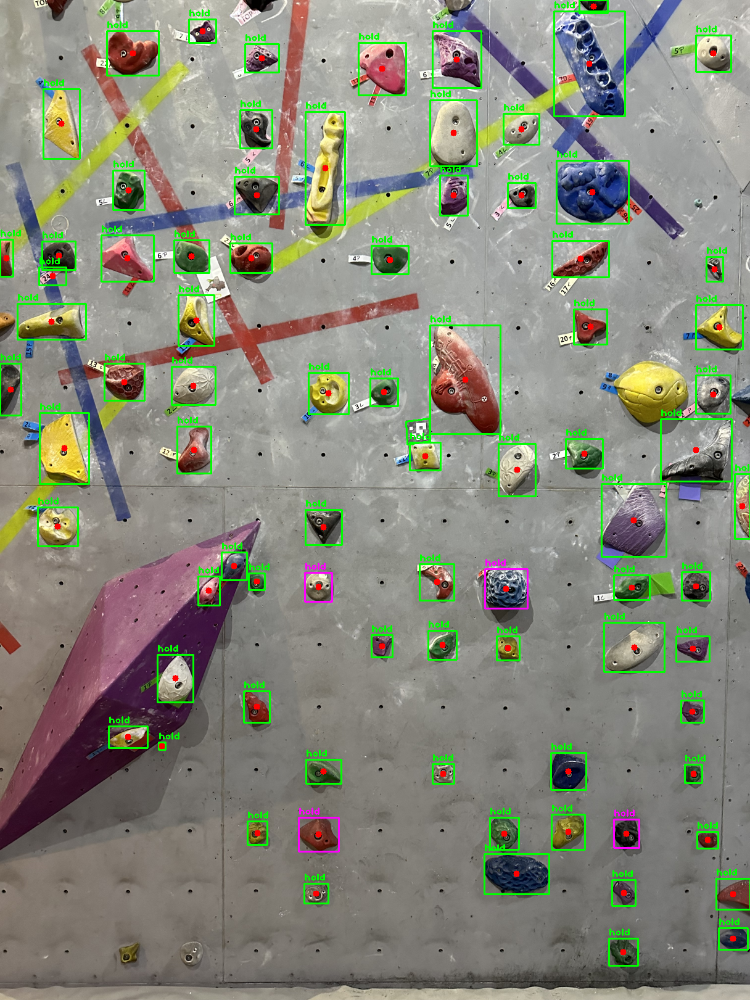

In [19]:
image_utils.display_image(img)

# Determine the distance between the starting steps and the starting holds

In [20]:
def get_center(center: np.ndarray) -> tuple:
    return tuple(center.astype(int))

In [21]:
center_point = get_center(random_starting_steps_centers[0])

if track_result.boxes.id is not None:
    boxes = track_result.boxes.xyxy.cpu()
    track_ids = track_result.boxes.id.int().cpu().tolist()

    for box, track_id in zip(boxes, track_ids):
        annotator.box_label(box, label=str(track_id), color=config.BBOX_COLOR)
        annotator.visioneye(box, center_point)

        x1, y1 = int((box[0] + box[2]) // 2), int((box[1] + box[3]) // 2)    # Bounding box centroid

        distance = (math.sqrt((x1 - center_point[0]) ** 2 + (y1 - center_point[1]) ** 2))/marker.get_pixel_per_meter()
        distance_per_centimeter = distance * 100

        text_size, _ = cv2.getTextSize(f"Distance: {distance_per_centimeter:.2f} cm", cv2.FONT_HERSHEY_SIMPLEX,1.2, 3)
        cv2.rectangle(img, (x1, y1 - text_size[1] - 10),(x1 + text_size[0] + 10, y1), config.TXT_BG_COLOR, -1)
        cv2.putText(img, f"Distance: {distance_per_centimeter:.2f} cm",(x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX, 1.2,config.TXT_COLOR, 3)

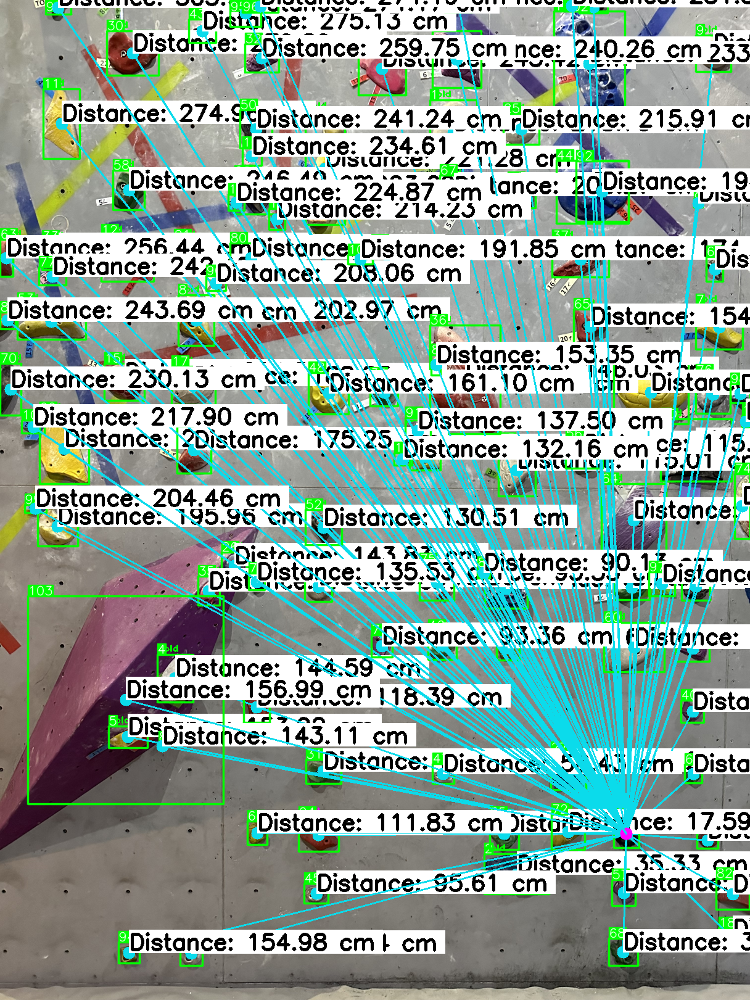

In [22]:
image_utils.display_image(img)